In [ ]:
import pandas as pd
import numpy as np


In [ ]:
!pip install kaggle

In [ ]:
! kaggle datasets download -d ashfakyeafi/cat-dog-images-for-classification

Dataset URL: https://www.kaggle.com/datasets/ashfakyeafi/cat-dog-images-for-classification
License(s): CC0-1.0
cat-dog-images-for-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile

with zipfile.ZipFile('/content/cat-dog-images-for-classification.zip', 'r') as zip_ref:
    # List all files in the zip
    zip_ref.extractall('/content')
    zip_contents = zip_ref.namelist()
    print(zip_contents)


['cat_dog.csv', 'cat_dog/cat.0.jpg', 'cat_dog/cat.1.jpg', 'cat_dog/cat.10.jpg', 'cat_dog/cat.100.jpg', 'cat_dog/cat.1000.jpg', 'cat_dog/cat.10000.jpg', 'cat_dog/cat.10001.jpg', 'cat_dog/cat.10002.jpg', 'cat_dog/cat.10003.jpg', 'cat_dog/cat.10004.jpg', 'cat_dog/cat.10005.jpg', 'cat_dog/cat.10006.jpg', 'cat_dog/cat.10007.jpg', 'cat_dog/cat.10008.jpg', 'cat_dog/cat.10009.jpg', 'cat_dog/cat.1001.jpg', 'cat_dog/cat.10010.jpg', 'cat_dog/cat.10011.jpg', 'cat_dog/cat.10012.jpg', 'cat_dog/cat.10013.jpg', 'cat_dog/cat.10014.jpg', 'cat_dog/cat.10015.jpg', 'cat_dog/cat.10016.jpg', 'cat_dog/cat.10017.jpg', 'cat_dog/cat.10018.jpg', 'cat_dog/cat.10019.jpg', 'cat_dog/cat.1002.jpg', 'cat_dog/cat.10020.jpg', 'cat_dog/cat.10021.jpg', 'cat_dog/cat.10022.jpg', 'cat_dog/cat.10023.jpg', 'cat_dog/cat.10024.jpg', 'cat_dog/cat.10025.jpg', 'cat_dog/cat.10026.jpg', 'cat_dog/cat.10027.jpg', 'cat_dog/cat.10028.jpg', 'cat_dog/cat.10029.jpg', 'cat_dog/cat.1003.jpg', 'cat_dog/cat.10030.jpg', 'cat_dog/cat.10031.jpg', '

In [ ]:
import os
extracted_path = '/content/cat_dog'
files = os.listdir(extracted_path)
print(files)  # This should show both cat and dog images


['dog.8151.jpg', 'dog.12210.jpg', 'dog.5590.jpg', 'dog.6970.jpg', 'cat.1887.jpg', 'dog.12415.jpg', 'dog.3506.jpg', 'cat.4906.jpg', 'cat.4095.jpg', 'dog.6881.jpg', 'dog.5831.jpg', 'cat.3236.jpg', 'cat.6490.jpg', 'cat.1576.jpg', 'cat.1585.jpg', 'cat.693.jpg', 'dog.9388.jpg', 'cat.914.jpg', 'dog.3626.jpg', 'dog.5107.jpg', 'dog.6388.jpg', 'cat.3150.jpg', 'dog.5808.jpg', 'cat.2150.jpg', 'cat.5588.jpg', 'cat.10938.jpg', 'dog.10976.jpg', 'dog.7470.jpg', 'dog.4159.jpg', 'cat.10331.jpg', 'dog.3877.jpg', 'cat.12067.jpg', 'cat.8608.jpg', 'dog.11341.jpg', 'dog.2802.jpg', 'cat.1351.jpg', 'dog.8730.jpg', 'dog.5219.jpg', 'cat.11046.jpg', 'dog.3211.jpg', 'dog.9912.jpg', 'dog.3352.jpg', 'cat.8346.jpg', 'cat.4806.jpg', 'dog.9106.jpg', 'cat.385.jpg', 'cat.6095.jpg', 'cat.11835.jpg', 'cat.5122.jpg', 'cat.1594.jpg', 'cat.3832.jpg', 'cat.6643.jpg', 'cat.10536.jpg', 'cat.8134.jpg', 'dog.9270.jpg', 'dog.5644.jpg', 'cat.11141.jpg', 'dog.4172.jpg', 'cat.3019.jpg', 'dog.4264.jpg', 'cat.4462.jpg', 'dog.7545.jpg',

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Flatten, Dense, Dropout
from keras.layers import Conv2D, MaxPool2D, BatchNormalization, Activation

# Load the CSV file
df = pd.read_csv('/content/cat_dog.csv')

# Check the first few rows to confirm the structure
print(df.head())


           image  labels
0  dog.11289.jpg       1
1  cat.10836.jpg       0
2   cat.7970.jpg       0
3   cat.2212.jpg       0
4   dog.2653.jpg       1


In [ ]:
df["labels"] = df["labels"].replace({0: 'cat', 1: 'dog'})

<Axes: xlabel='labels'>

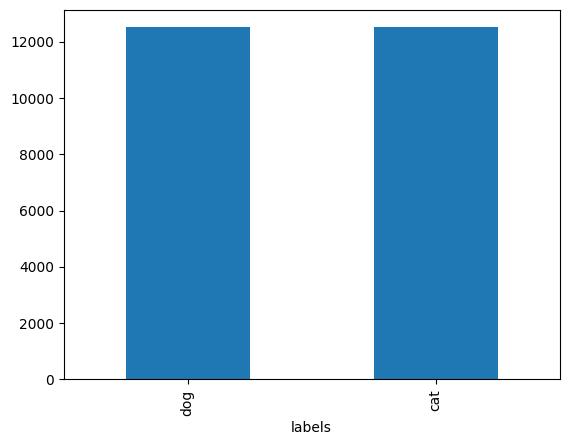

In [ ]:
df["labels"].value_counts().plot.bar()

In [ ]:
train_df, valid_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)

In [ ]:
train_df['labels'].value_counts()

,count
labels,
dog,10008
cat,9992


<Axes: xlabel='labels'>

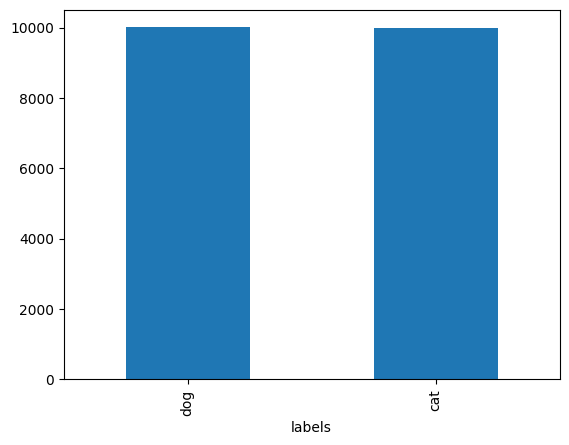

In [ ]:
train_df['labels'].value_counts().plot.bar()

In [ ]:
valid_df['labels'].value_counts()

,count
labels,
cat,2508
dog,2492


In [ ]:
FAST_RUN = False
IMAGE_WIDTH=128
IMAGE_HEIGHT=128
IMAGE_CHANNELS=3
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)

In [ ]:
total_train = train_df.shape[0]
total_validate = valid_df.shape[0]
batch_size=15

In [ ]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    "/content/cat_dog",
    x_col='image',
    y_col='labels',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 20000 validated image filenames belonging to 2 classes.


In [ ]:
valid_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = valid_datagen.flow_from_dataframe(
    valid_df,
    "/content/cat_dog",
    x_col='image',
    y_col='labels',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 5000 validated image filenames belonging to 2 classes.


In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)),
#     BatchNormalization(),
    MaxPool2D(pool_size=(4,4)),
    Dropout(rate=0.25),
    Conv2D(64, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D(pool_size=(4,4)),
    Dropout(rate=0.25),

    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPool2D(pool_size=(4,4)),
    Dropout(rate=0.25),

    Flatten(),

    Dense(512, activation='relu'),
    Dropout(rate=0.5),
    Dense(2, activation='softmax')

])



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 31, 31, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 31, 31, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 29, 29, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 29, 29, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 5, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 5, 5, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 1, 1, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1, 1, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │          66,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │           1,026 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 161,090 (629.26 KB)

 Trainable params: 160,706 (627.76 KB)

 Non-trainable params: 384 (1.50 KB)

In [ ]:
'''history = model.fit(train_generator,
                    epochs=10,
                    validation_data=valid_generator
)'''

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1334/1334 ━━━━━━━━━━━━━━━━━━━━ 140s 95ms/step - accuracy: 0.5308 - loss: 0.8335 - val_accuracy: 0.5164 - val_loss: 1.5611
Epoch 2/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 125s 90ms/step - accuracy: 0.5966 - loss: 0.6719 - val_accuracy: 0.5986 - val_loss: 0.7703
Epoch 3/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 122s 91ms/step - accuracy: 0.6339 - loss: 0.6465 - val_accuracy: 0.7012 - val_loss: 0.5801
Epoch 4/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 118s 88ms/step - accuracy: 0.6796 - loss: 0.6043 - val_accuracy: 0.6730 - val_loss: 0.6023
Epoch 5/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 120s 89ms/step - accuracy: 0.7055 - loss: 0.5750 - val_accuracy: 0.7780 - val_loss: 0.4764
Epoch 6/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 146s 92ms/step - accuracy: 0.7056 - loss: 0.5669 - val_accuracy: 0.5884 - val_loss: 0.8766
Epoch 7/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 124s 93ms/step - accuracy: 0.7387 - loss: 0.5335 - val_accuracy: 0.7398 - val_loss: 0.5330
Epoch 8/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 131s 98ms/step - accuracy: 0.7581 - lo

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Update the input shape to match your train_generator's target_size
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))


base_model.trainable = False
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

predictions = Dense(2, activation='softmax')(x)


model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])


early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)

history = model.fit(train_generator,
                    epochs=10,
                    validation_data=valid_generator,
                    callbacks=[early_stopping])


Epoch 1/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 146s 108ms/step - accuracy: 0.7811 - loss: 0.4698 - val_accuracy: 0.8764 - val_loss: 0.3026
Epoch 2/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 138s 103ms/step - accuracy: 0.8558 - loss: 0.3335 - val_accuracy: 0.8742 - val_loss: 0.2912
Epoch 3/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 142s 106ms/step - accuracy: 0.8584 - loss: 0.3210 - val_accuracy: 0.8810 - val_loss: 0.2783
Epoch 4/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 149s 111ms/step - accuracy: 0.8613 - loss: 0.3200 - val_accuracy: 0.8812 - val_loss: 0.2783
Epoch 5/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 190s 102ms/step - accuracy: 0.8647 - loss: 0.3087 - val_accuracy: 0.8746 - val_loss: 0.2894
Epoch 6/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 140s 101ms/step - accuracy: 0.8696 - loss: 0.3016 - val_accuracy: 0.8870 - val_loss: 0.2666
Epoch 7/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 145s 104ms/step - accuracy: 0.8682 - loss: 0.2984 - val_accuracy: 0.8842 - val_loss: 0.2701
Epoch 8/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 139s 102ms/step - ac

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
Prediction for /content/cat_dog/cat.10.jpg: Cat


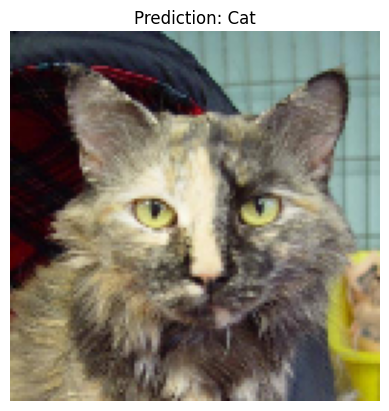

None
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Prediction for /content/cat_dog/dog.100.jpg: Dog


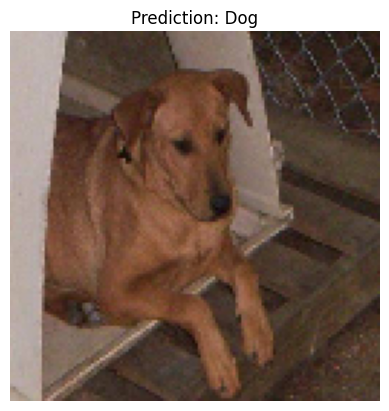

None


In [ ]:

from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

def predict_image(img_path):
    img = image.load_img(img_path, target_size=(128, 128))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.

    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)

    if predicted_class == 0:
        print(f"Prediction for {img_path}: Cat")
    else:
        print(f"Prediction for {img_path}: Dog")

    # Display the image
    plt.imshow(img)
    plt.title(f"Prediction: {'Cat' if predicted_class == 0 else 'Dog'}")
    plt.axis('off')
    plt.show()



image_paths = ['/content/cat_dog/cat.10.jpg', '/content/cat_dog/dog.100.jpg']
for image_path in image_paths:
    print(predict_image(image_path))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Prediction for /content/cat_dog/cat.9422.jpg: Cat


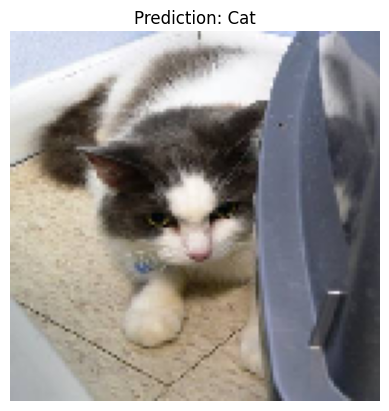

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Prediction for /content/cat_dog/cat.10717.jpg: Cat


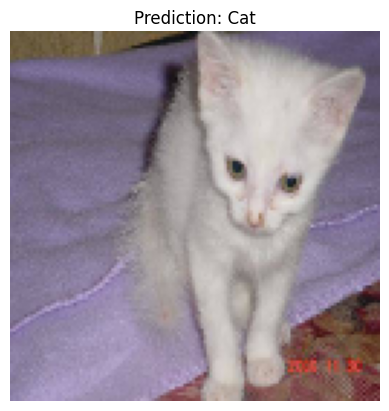

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Prediction for /content/cat_dog/cat.1154.jpg: Cat


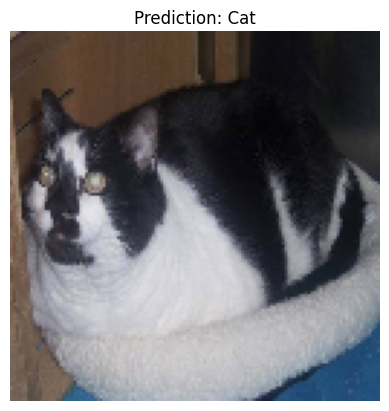

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Prediction for /content/cat_dog/dog.5366.jpg: Dog


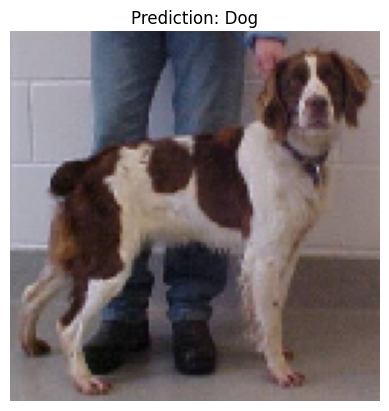

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Prediction for /content/cat_dog/dog.5001.jpg: Dog


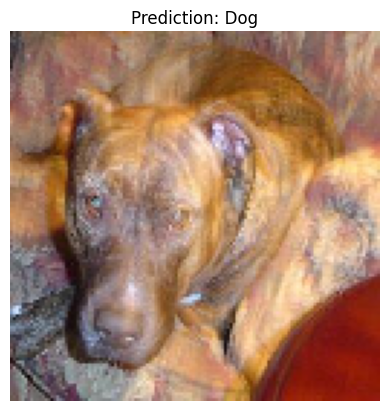

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/dog.6661.jpg: Dog


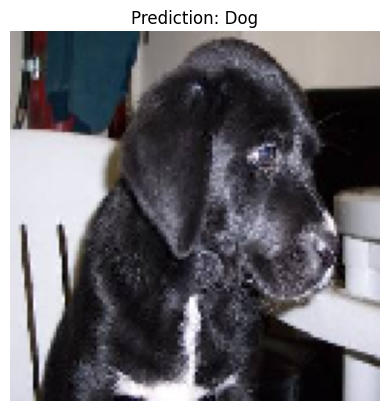

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction for /content/cat_dog/dog.7548.jpg: Dog


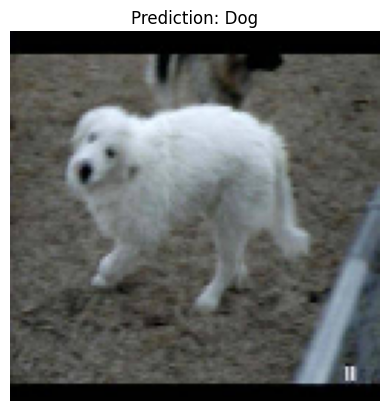

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction for /content/cat_dog/cat.693.jpg: Cat


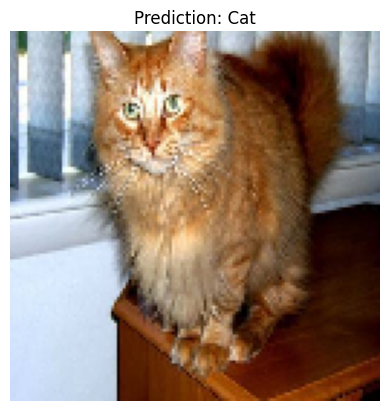

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prediction for /content/cat_dog/cat.8169.jpg: Cat


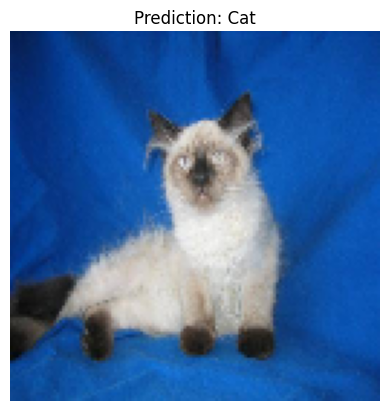

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prediction for /content/cat_dog/dog.5395.jpg: Dog


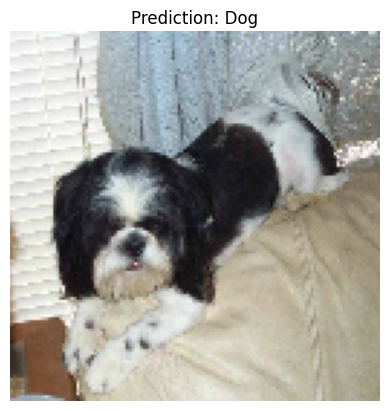

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/dog.3494.jpg: Dog


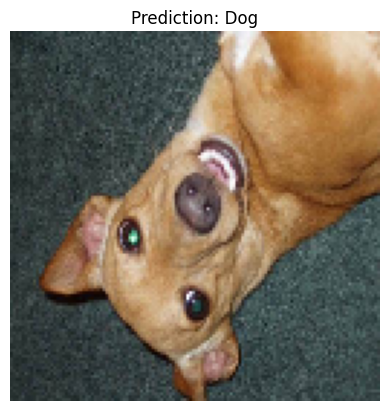

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prediction for /content/cat_dog/dog.10435.jpg: Dog


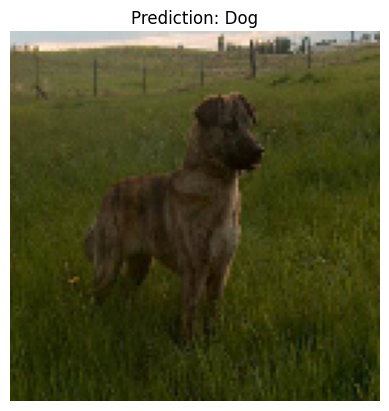

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prediction for /content/cat_dog/dog.4387.jpg: Dog


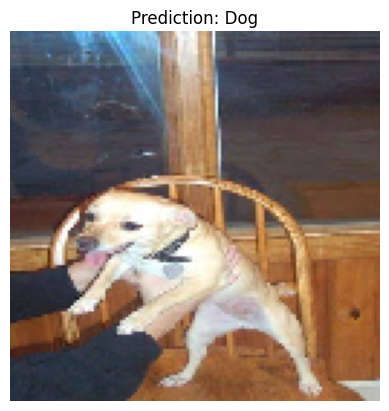

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Prediction for /content/cat_dog/cat.338.jpg: Cat


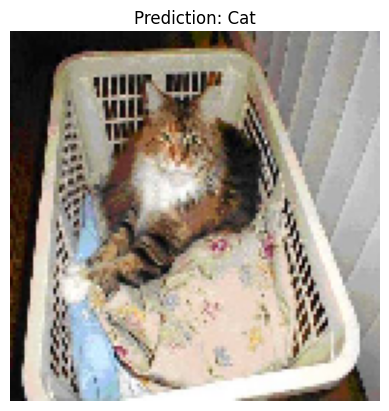

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction for /content/cat_dog/dog.3629.jpg: Cat


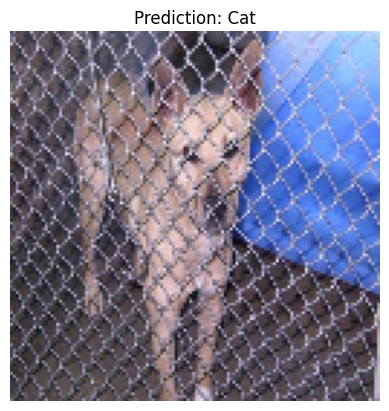

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction for /content/cat_dog/cat.10750.jpg: Cat


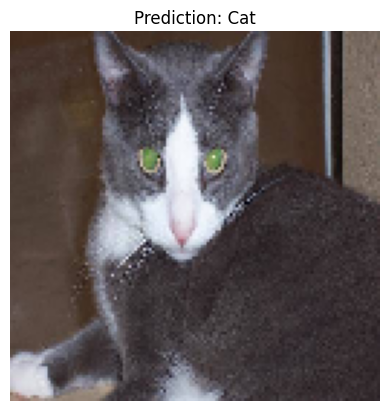

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction for /content/cat_dog/cat.10484.jpg: Cat


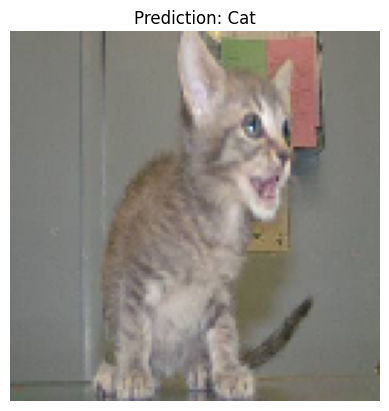

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/cat.882.jpg: Cat


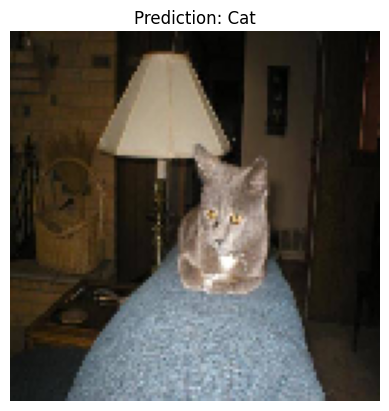

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prediction for /content/cat_dog/cat.2219.jpg: Cat


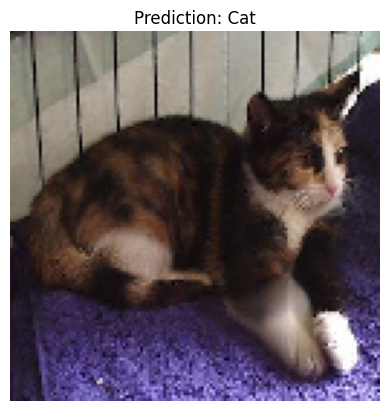

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction for /content/cat_dog/dog.2569.jpg: Dog


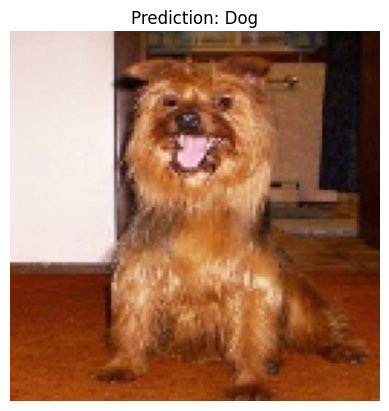

In [ ]:
import os
import random

image_dir = '/content/cat_dog'
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

num_images_to_predict = min(20, len(image_files))
selected_images = random.sample(image_files, num_images_to_predict)

for image_file in selected_images:
    image_path = os.path.join(image_dir, image_file)
    predict_image(image_path)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 148s 104ms/step - accuracy: 0.9134 - loss: 0.2147 - val_accuracy: 0.9644 - val_loss: 0.0951 - learning_rate: 1.0000e-04
Epoch 2/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 127s 95ms/step - accuracy: 0.9525 - loss: 0.1234 - val_accuracy: 0.9626 - val_loss: 0.0967 - learning_rate: 1.0000e-04
Epoch 3/10
1332/1334 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9544 - loss: 0.1160
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 127s 95ms/step - accuracy: 0.9544 - loss: 0.1160 - val_accuracy: 0.9598 - val_loss: 0.0980 - learning_rate: 1.0000e-04
Epoch 4/10
1334/1334 ━━━━━━━━━━━━━━━━━━━━ 125s 93ms/step - accuracy: 0.9611 - loss: 0.0975 - val_accuracy: 0.9588 - val_loss: 0.1026 - learning_rate: 5.0000e-05
Epoch 4: early stopping
Restoring model weights from the end of the best epoch: 1.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Prediction for /content/cat_dog/c

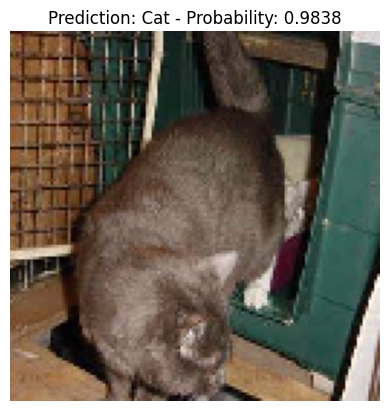

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/cat.12023.jpg: Cat


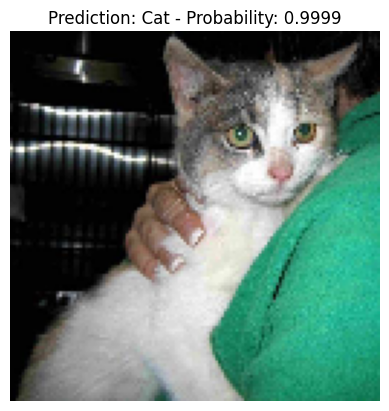

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction for /content/cat_dog/dog.3274.jpg: Dog


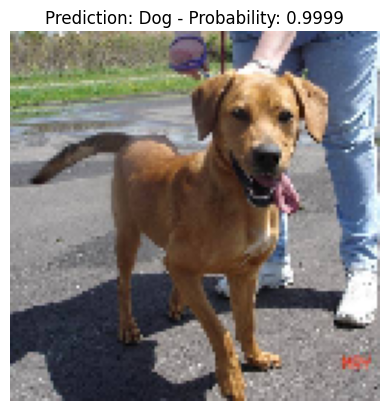

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction for /content/cat_dog/dog.2618.jpg: Dog


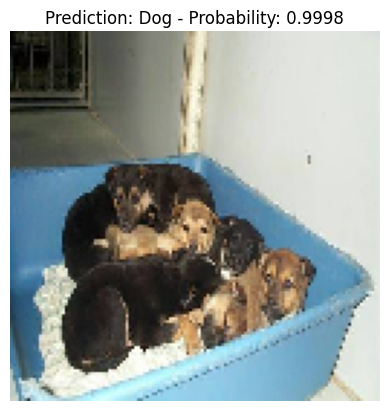

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Prediction for /content/cat_dog/dog.861.jpg: Dog


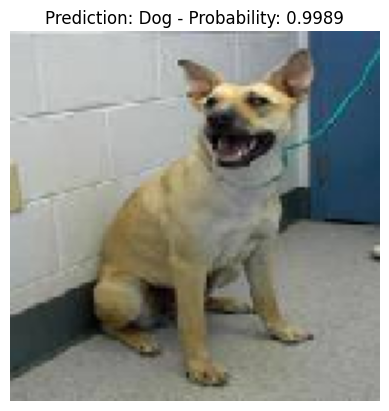

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Prediction for /content/cat_dog/cat.7216.jpg: Cat


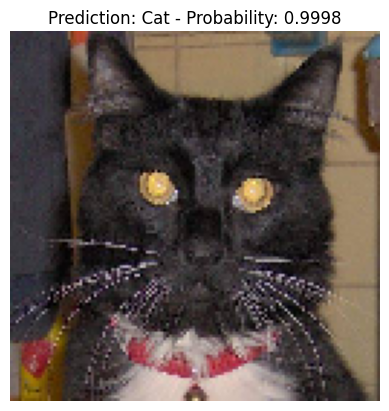

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prediction for /content/cat_dog/cat.7146.jpg: Cat


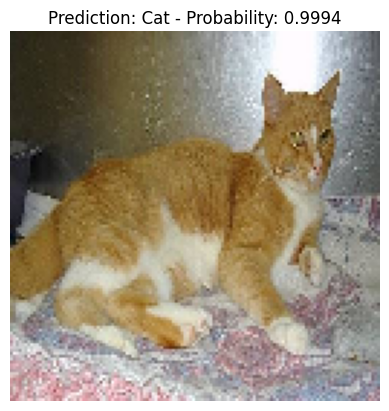

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prediction for /content/cat_dog/dog.11119.jpg: Dog


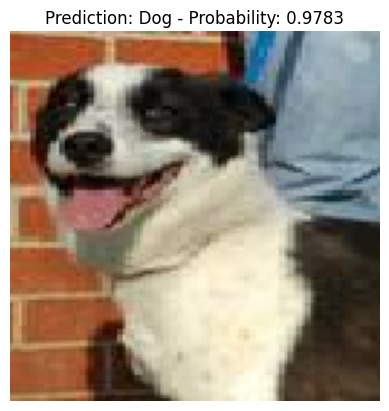

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/cat.3244.jpg: Cat


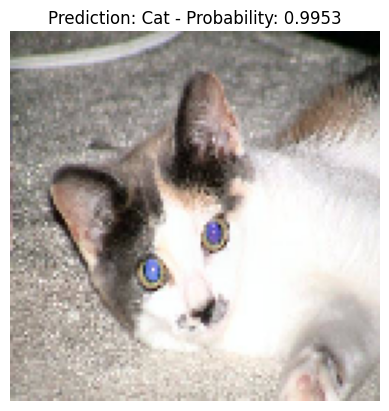

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Prediction for /content/cat_dog/cat.9923.jpg: Cat


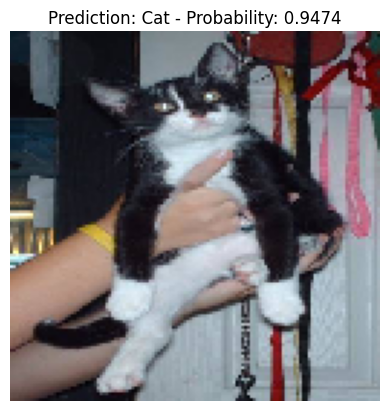

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prediction for /content/cat_dog/dog.4912.jpg: Dog


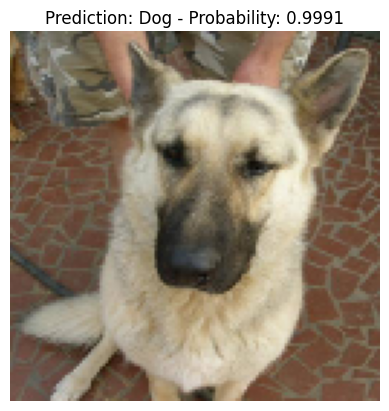

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Prediction for /content/cat_dog/cat.6809.jpg: Cat


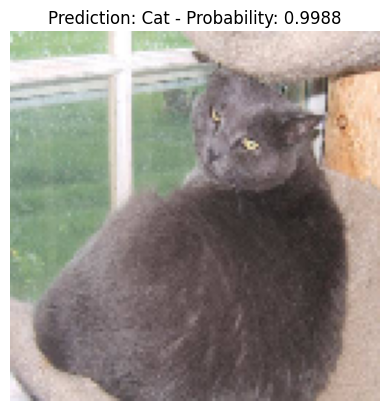

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Prediction for /content/cat_dog/cat.6185.jpg: Cat


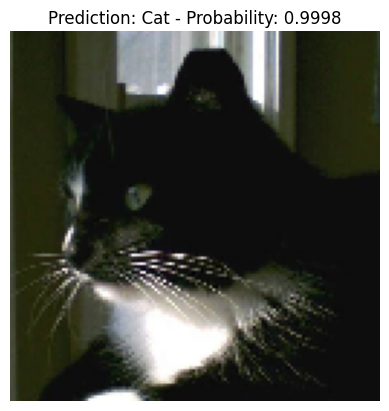

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prediction for /content/cat_dog/cat.11227.jpg: Cat


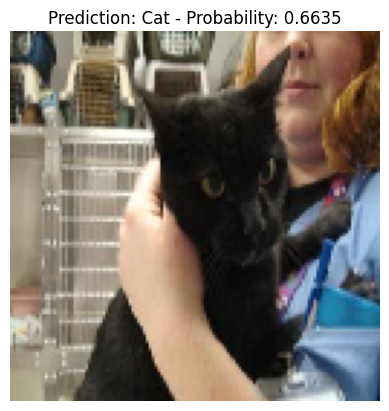

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Prediction for /content/cat_dog/cat.4332.jpg: Cat


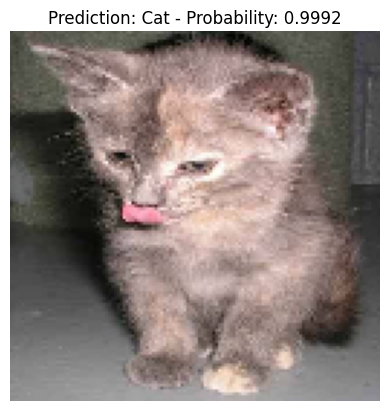

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prediction for /content/cat_dog/dog.899.jpg: Dog


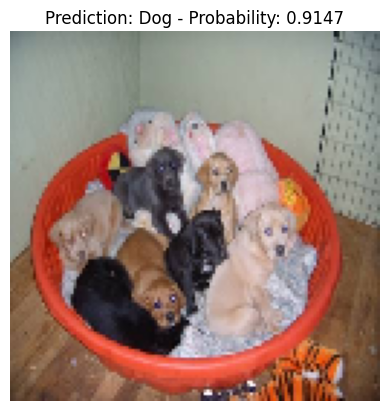

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prediction for /content/cat_dog/cat.3190.jpg: Cat


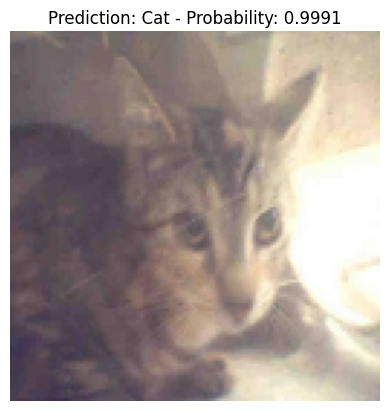

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Prediction for /content/cat_dog/cat.4079.jpg: Cat


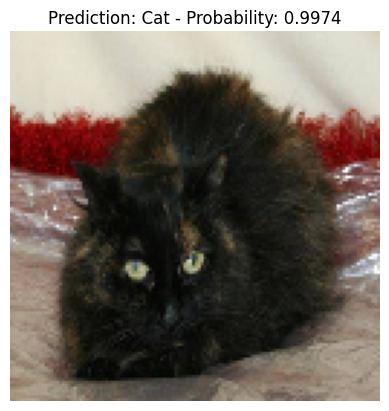

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prediction for /content/cat_dog/dog.916.jpg: Dog


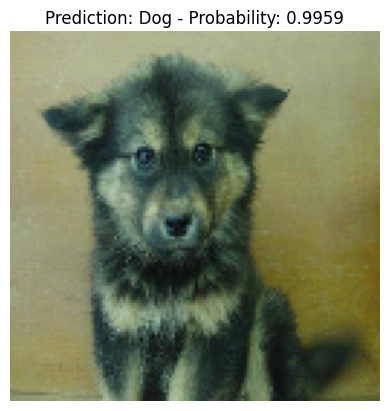

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prediction for /content/cat_dog/cat.7711.jpg: Cat


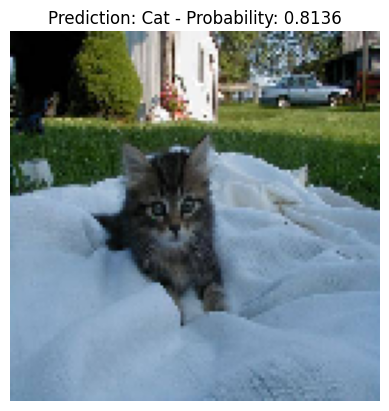

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import  ReduceLROnPlateau
import random
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# MobileNetV2-based Transfer Learning


base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))
base_model.trainable = False  # Freeze base layers initially

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(2, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])


early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=valid_generator,
    callbacks=[early_stopping, lr_scheduler]
)


def predict_image(img_path):

    img = image.load_img(img_path, target_size=(IMAGE_WIDTH, IMAGE_HEIGHT))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)  # Use MobileNetV2 preprocessing


    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)


    if predicted_class == 0:
        print(f"Prediction for {img_path}: Cat")
    else:
        print(f"Prediction for {img_path}: Dog")

    # Plot the image
    plt.imshow(img)
    plt.title(f"Prediction: {'Cat' if predicted_class == 0 else 'Dog'} - Probability: {prediction[0][predicted_class]:.4f}")
    plt.axis('off')
    plt.show()
    return f"Prediction for {img_path}: {'Cat' if predicted_class == 0 else 'Dog'} - Probability: {prediction[0][predicted_class]:.4f}"



# Prediction on 20 images
image_dir = '/content/cat_dog'
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
num_images_to_predict = min(20, len(image_files))
selected_images = random.sample(image_files, num_images_to_predict)

for image_file in selected_images:
    image_path = os.path.join(image_dir, image_file)
    predict_image(image_path)
